In [3]:
import pickle, fileinput
import json

In [4]:
import sys, os


In [41]:
os.listdir('.')

['Add_blue_if_visited.png',
 'half_of_max_hot_warm_map.png',
 '.DS_Store',
 'max_hot_1_player.png',
 'Add_blue_if_visited_half.png',
 'burn_map.ipynb',
 'map.png',
 'map\xa0— копия.png',
 'replays_wl',
 'README.md',
 'winter_steps.png',
 'replays',
 'max_hot_2_player.png',
 '.ipynb_checkpoints',
 '.git',
 'burn_map_winter_steps.ipynb']

In [21]:
files_list = os.listdir('replays_wl')

In [22]:
files_list

['1069',
 '797',
 '909',
 '135',
 '307',
 '763',
 '551',
 '1432',
 '1264',
 '61',
 '1056',
 '1290',
 '95',
 '338',
 '936',
 '556',
 '764',
 '300',
 '132',
 '59',
 '790',
 '931',
 '1297',
 '569',
 '92',
 '1051',
 '1263',
 '66',
 '1435',
 '336',
 '938',
 '104',
 '560',
 '752',
 '1058',
 '1093',
 '907',
 '309',
 '1403',
 '1067',
 '799',
 '50',
 '1255',
 '68',
 '593',
 '755',
 '1299',
 '567',
 '103',
 '331',
 '57',
 '1252',
 '1060',
 '1404',
 '900',
 '558',
 '1094',
 '1034',
 '1206',
 '1450',
 '168',
 '954',
 '391',
 '1239',
 '533',
 '701',
 '365',
 '157',
 '739',
 '953',
 '1457',
 '1201',
 '1033',
 '150',
 '362',
 '706',
 '534',
 '998',
 '1468',
 '396',
 '1495',
 '159',
 '965',
 '32',
 '1237',
 '1005',
 '1461',
 '991',
 '730',
 '502',
 '166',
 '354',
 '192',
 '1208',
 '996',
 '1466',
 '398',
 '1002',
 '35',
 '1230',
 '708',
 '962',
 '1492',
 '1459',
 '195',
 '353',
 '161',
 '505',
 '737',
 '1298',
 '566',
 '754',
 '330',
 '102',
 '592',
 '69',
 '901',
 '1095',
 '559',
 '1061',
 '56',
 '12

In [7]:
def extract_steps(file):
    pre_parts = file.split('[command]')
#     print(pre_parts[1])
    parts = [pre_part.split('[/command]')[0] for pre_part in pre_parts if '[/command]' in pre_part]
    return parts

In [51]:
filename = 'replays/CoB/CotB-vvd.L-peanut.D-T17-20201107-0617'

In [52]:
with open(filename, 'r') as f:
    text = f.read()

In [53]:
steps = extract_steps(text)


undo="no"
[speak]
id="peanut"
message="gl hf"
side="2"
time="1604726374"
[/speak]
[/command]

	


In [54]:
steps

['\nundo="no"\n[speak]\nid="peanut"\nmessage="gl hf"\nside="2"\ntime="1604726374"\n[/speak]\n',
 '\n\t\t[init_side]\n\t\t\tside_number=1\n\t\t[/init_side]\n\t\t[checkup]\n\t\t\t[result]\n\t\t\t\tnext_unit_id=18\n\t\t\t\trandom_calls=0\n\t\t\t[/result]\n\t\t[/checkup]\n\t',
 '\nundo="no"\n[speak]\nid="vvd"\nmessage="u2"\nside="1"\ntime="1604726386"\n[/speak]\n',
 '\n\t\tfrom_side=1\n\t\t[recruit]\n\t\t\ttype="Spearman"\n\t\t\tx=18\n\t\t\ty=5\n\t\t\t[from]\n\t\t\t\tx=21\n\t\t\t\ty=4\n\t\t\t[/from]\n\t\t[/recruit]\n\t\t[checkup]\n\t\t[/checkup]\n\t',
 '\ndependent="yes"\nfrom_side="server"\n[random_seed]\nnew_seed="8b6872a1"\n[/random_seed]\n',
 '\n\t\tfrom_side=1\n\t\t[recruit]\n\t\t\ttype="Cavalryman"\n\t\t\tx=18\n\t\t\ty=4\n\t\t\t[from]\n\t\t\t\tx=21\n\t\t\t\ty=4\n\t\t\t[/from]\n\t\t[/recruit]\n\t\t[checkup]\n\t\t[/checkup]\n\t',
 '\ndependent="yes"\nfrom_side="server"\n[random_seed]\nnew_seed="342bd623"\n[/random_seed]\n',
 '\n\t\tfrom_side=1\n\t\t[recruit]\n\t\t\ttype="Spearman"\n\t\

In [8]:
def extract_recruit(step):
    x_co = step.split('x=')[1].split('\n')[0]
    y_co = step.split('y=')[1].split('\n')[0]
    return (x_co, y_co)

In [56]:
for step in steps:
    if '[recruit]' in step:
        print(extract_recruit(step))
        break

('18', '5')


In [9]:
def extract_moves(step, mode='all'):
    x_co = step.split('x=\"')[1].split('\"\n')[0].split(',')
    y_co = step.split('y=\"')[1].split('\"\n')[0].split(',')
    if mode == 'all':
        return list(zip(x_co, y_co))
    if mode == 'finish':
        return ((x_co[0], y_co[0]), (x_co[-1], y_co[-1]))

In [79]:
for step in steps:
    if '[move]' in step:
        print(extract_moves(step))
        break

[('21', '4'), ('20', '4'), ('19', '4'), ('18', '3'), ('17', '3')]


In [10]:
def extract_fight(step):
    x_at = step.split('x=')[1].split('\n')[0].split(',')
    y_at = step.split('y=')[1].split('\n')[0].split(',')
    x_def = step.split('x=')[2].split('\n')[0].split(',')
    y_def = step.split('y=')[2].split('\n')[0].split(',')
    return ((x_at[0], y_at[0]), (x_def[0], y_def[0]))

In [238]:
steps[0]

'\n\t\tfrom_side=2\n\t\t[attack]\n\t\t\tattacker_lvl=1\n\t\t\tattacker_type="Saurian Skirmisher"\n\t\t\tdefender_lvl=1\n\t\t\tdefender_type="Merman Fighter"\n\t\t\tdefender_weapon=-1\n\t\t\ttod="dusk"\n\t\t\tturn=4\n\t\t\tweapon=1\n\t\t\t[source]\n\t\t\t\tx=20\n\t\t\t\ty=14\n\t\t\t[/source]\n\t\t\t[destination]\n\t\t\t\tx=20\n\t\t\t\ty=15\n\t\t\t[/destination]\n\t\t[/attack]\n\t\t[checkup]\n\t\t[/checkup]\n\t'

In [239]:
extract_fight(steps[0])

(('20', '14'), ('20', '15'))

In [11]:
def make_hex(hex_info):
    return str(hex_info[0]) + '_' + str(hex_info[1])

In [81]:
make_hex(('18', '5'))

'18_5'

In [12]:
from collections import defaultdict


In [13]:
warm_map = defaultdict(int)

In [15]:
for i in range(1, 44):
    for j in range(1, 29):
        warm_map[str(i) + '_' + str(j)] = 0

In [55]:
warm_map = defaultdict(int)

for i in range(1, 44):
    for j in range(1, 29):
        warm_map[str(i) + '_' + str(j)] = 0

count_good_files = 0
for file in files_list:
    filename = 'replays_wl/' + file
    try:
        with open(filename, 'r') as f:
            text = f.read()
    except:
        print(filename)
        continue
    try:
        if "WL_Winter_Steps" not in text:
            if text.split('scenario')[1].split("\n")[0]:
                continue
    except:
        continue
        print(text)
    print(file)
#     steps = extract_steps(text)
#     for step in steps:
#         if '[move]' in step:
#             moves = extract_moves(step)
#             for move in moves[1:]:
#                 warm_map[make_hex(move)] += 1
#         elif '[recruit]' in step:
#             warm_map[make_hex(extract_recruit(step))] += 1
            
    

875
895
869
922
925
913
1478


In [68]:
warm_map = defaultdict(int)

for i in range(1, 44):
    for j in range(1, 29):
        warm_map[str(i) + '_' + str(j)] = 0

count_good_files = 0
for file in ["770", "775", "781", "782", "783", "784", "869", "875", "895", "913", "922", "925", "1478"]:
    filename = 'replays_wl/' + file
    try:
        with open(filename, 'r') as f:
            text = f.read()
    except:
        print(filename)
        continue
    count_good_files += 1
    steps = extract_steps(text)
    for step in steps:
        if '[move]' in step:
            moves = extract_moves(step)
            for move in moves[1:]:
                warm_map[make_hex(move)] += 1
        elif '[recruit]' in step:
            warm_map[make_hex(extract_recruit(step))] += 1

In [108]:
ff = ["770", "775", "781", "782", "783", "784", "869", "875", "895", "913", "922", "925", "1478"]

In [45]:
count_good_files

13

In [46]:
 pre_parts = text.split('[command]')

In [47]:
len(pre_parts)

663

In [95]:
warm_map["24_6"], warm_map["25_6"]

(660, 362)

In [156]:
max_hot = 0
for hexx in warm_map:
    max_hot = max(max_hot, warm_map[hexx])

In [157]:
max_hot

1558

In [42]:
def get_hexx_from_str(strr):
    q = strr.split('_')
    return (int(q[0]), int(q[1]))

In [43]:
get_hexx_from_str("24_6")

(24, 6)

In [47]:
import PIL

In [48]:
from PIL import Image, ImageDraw

In [50]:
image = Image.open('winter_steps.png')
image_copy = image.copy()

In [51]:
canvas = Image.new('RGB', (30, 60), 'cyan')

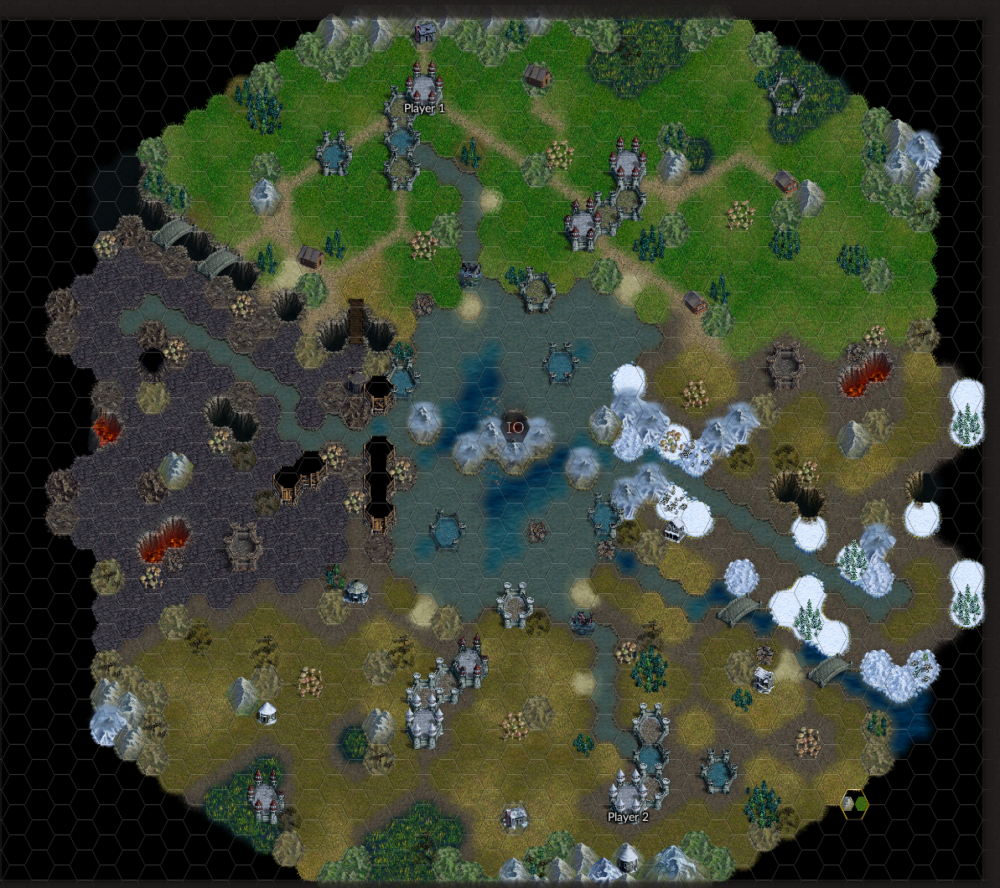

In [52]:
image

In [53]:
print(image.mode)

RGBA


In [54]:
print(image.size)

(1193, 1060)


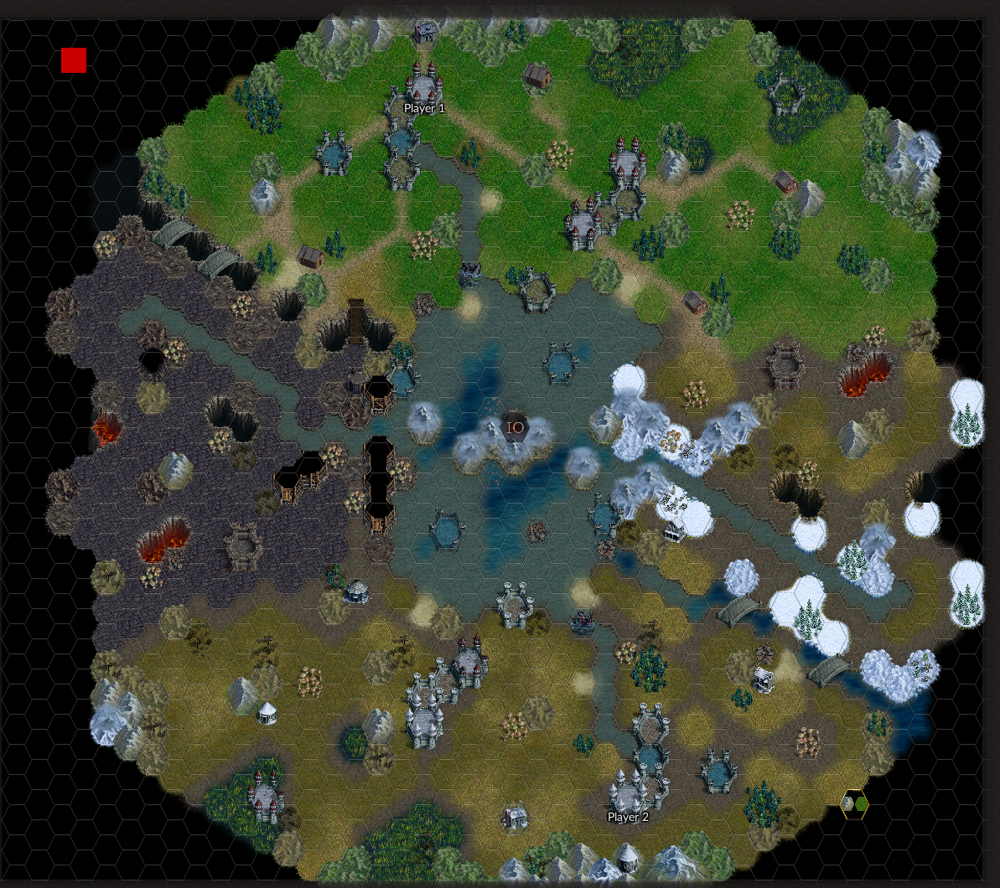

In [69]:
image_copy = image.copy()
max_hot = max(warm_map.values())
tt = warm_map["1_1"] / max_hot
qq = 1 - tt
canvas = Image.new('RGB', (30, 30), (int(255 * tt) + 200, 0, 0))
image_copy.paste(canvas, (73, 57))
image_copy

In [121]:
def count_color(hot, max_hot, mult = 1):
    hott = min(int(255 * mult * hot / max_hot), 255)
    if hott == 0:
        return (0, 0, 0)
    return (hott, 0, 255 - hott)

In [76]:
main_forward_shift = 27 # cool
main_down_shift = 36 # cool

In [127]:
image.size

(1193, 1060)

In [151]:
image_copy = image.copy()

for i in range(1, 44, 2):
    for j in range(1, 40):
        canvas = Image.new('RGB', (18, 18), count_color(warm_map[str(i) + "_" + str(j)], max_hot, 2))
        image_copy.paste(canvas, (10 + (i - 1)*main_forward_shift , 32 + (j - 1) * main_down_shift))

for i in range(2, 44, 2):
    for j in range(1, 40):
        canvas = Image.new('RGB', (18, 18), count_color(warm_map[str(i) + "_" + str(j)], max_hot, 2))
        image_copy.paste(canvas, (10 + (i - 1)*main_forward_shift , 48 + (j - 1) * main_down_shift))
# image_copy.save("WinterSteps_mult2.png")
ttt = Image.blend(image, image_copy, alpha=0.7)
ttt.save("WinterSteps_mult2.png")

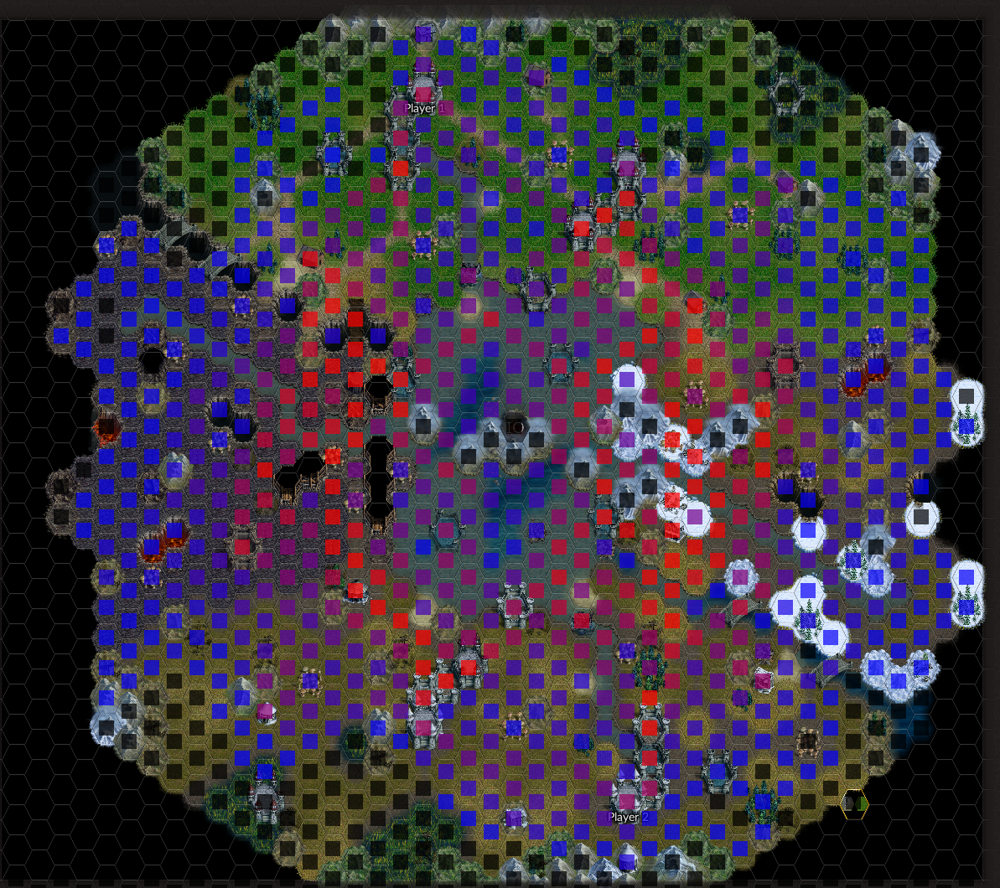

In [152]:
ttt

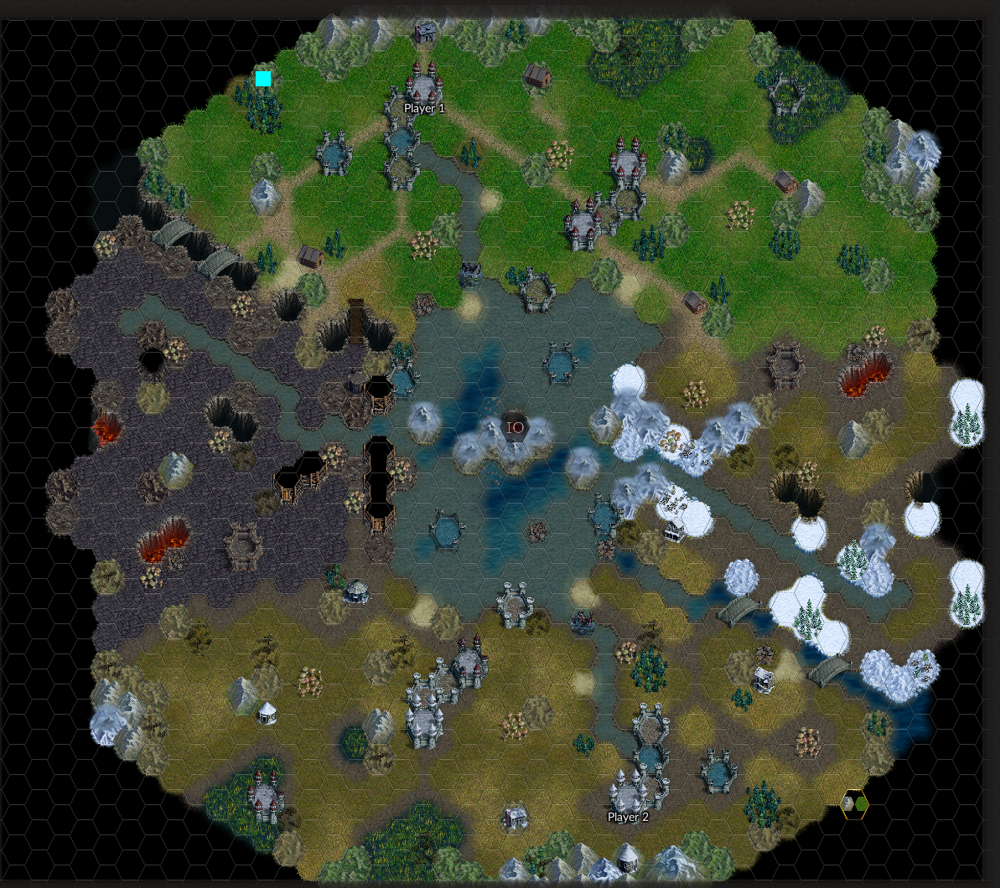

In [65]:
image_copy = image.copy()
canvas = Image.new('RGB', (18, 18), 'cyan')
image_copy.paste(canvas, (305, 85))
image_copy

In [172]:
warm_map["28_7"]

0

In [187]:
image_copy.save("Add_blue_if_visited.png")

In [114]:
warm_map_1_player = defaultdict(int)

for i in range(1, 42):
    for j in range(1, 25):
        warm_map_1_player[str(i) + '_' + str(j)] = 0
        
for file in ff:
    filename = 'replays_wl/' + file
    with open(filename, 'r') as f:
        text = f.read()
    steps = extract_steps(text)
    for step in steps:
        if 'from_side=2' not in step:
            continue
        if '[move]' in step:
            moves = extract_moves(step)
            for move in moves[1:]:
                warm_map_1_player[make_hex(move)] += 1
        elif '[recruit]' in step:
            warm_map_1_player[make_hex(extract_recruit(step))] += 1

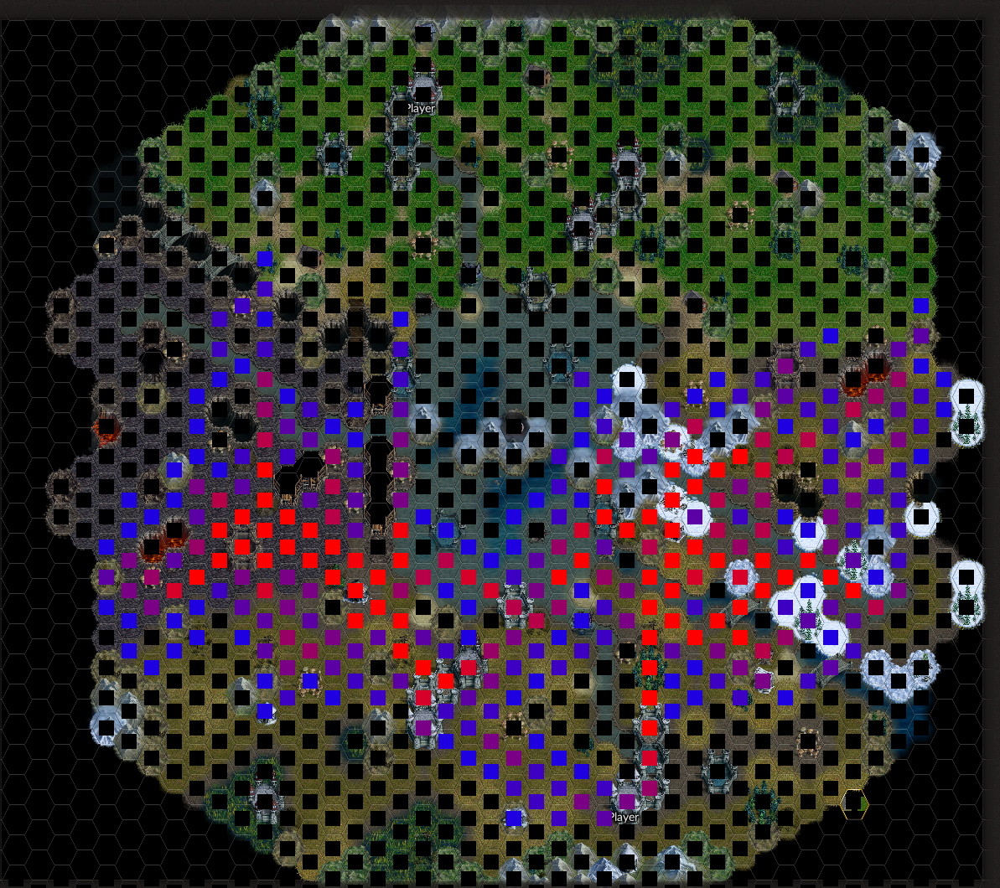

In [116]:
image_copy = image.copy()
max_hot_1_player = max(warm_map_1_player.values())
for i in range(1, 44, 2):
    for j in range(1, 40):
        canvas = Image.new('RGB', (18, 18), count_color(warm_map_1_player[str(i) + "_" + str(j)], max_hot_1_player, 3))
        #canvas = Image.new('RGB', (18, 18), 'cyan')
        image_copy.paste(canvas, (10 + (i - 1)*main_forward_shift , 32 + (j - 1) * main_down_shift))

for i in range(2, 44, 2):
    for j in range(1, 40):
        canvas = Image.new('RGB', (18, 18), count_color(warm_map_1_player[str(i) + "_" + str(j)], max_hot_1_player, 3))
        #canvas = Image.new('RGB', (18, 18), 'cyan')
        image_copy.paste(canvas, (10 + (i - 1)*main_forward_shift , 48 + (j - 1) * main_down_shift))
image_copy.save("WinterSteps_mult3_2_player.png")
image_copy

In [ ]:
def generate